# Preprocessing and registration
This notebook does basic preprocessing and registration for lightsheet data

Note v2 uses my saved data that was downsampled from imaris

version 3a contains downsampled data from imaris with origin and pixel set with metadata. It also has a fix where sampling was done on padded coordinates rather than unpadded

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook
import os
from glob import glob
from os.path import join as pathjoin
import time

import sys
sys.path.append('..')
import imp
import donglab_workflows as dw
imp.reload(dw)

import torch # this will just set the dtype


In [2]:
# for now add emlddmm library for registration
import sys
sys.path.append('/home/dtward/data/csh_data/emlddmm')
import emlddmm
imp.reload(emlddmm)

<module 'emlddmm' from '/home/dtward/data/csh_data/emlddmm/emlddmm.py'>

In [3]:
# TODO: collect all input arguments in this cell
target_name = '/nafs/dtward/dong/final_output/SW220510_LS/SW220510_02_LS_6x_1000z_ch_0_pow_[0.125]_down.npz'
# where should outputs go?
output_prefix = 'lightsheet_outputs_2022_09_21/'
output_prefix = 'lightsheet_outputs_2023_02_16/'
# load atlas images
atlas_names = [
    '/home/dtward/data/AllenInstitute/allen_vtk/ara_nissl_50.vtk',
    '/home/dtward/data/AllenInstitute/allen_vtk/average_template_50.vtk',
]
#seg_name = '/home/dtward/data/AllenInstitute/allen_vtk/annotation_50.vtk'
seg_name = '/nafs/dtward/dong/upenn_atlas/UPenn_labels_reoriented.vtk'
seg_name = '/nafs/dtward/dong/upenn_atlas/UPenn_labels_reoriented_origin.vtk'
ontology_name = output_prefix + 'allen_ontology.csv'
ontology_name = '/nafs/dtward/dong/upenn_atlas/atlas_info_KimRef_FPbasedLabel_v2.7.csv'
savename = 'transformation_outputs_lightsheet_v03newdownsample.npy'
device = 'cuda:1' # for pytorch

In [4]:
output_directory = os.path.split(output_prefix)[0]
if output_directory:
    if not os.path.exists(output_directory):
        os.mkdir(output_directory)

In [5]:
# load target image

In [6]:
target_data = np.load(target_name,allow_pickle=True)

In [7]:
def fix_shape(J,xJ):
    n = np.minimum(np.array(J.shape[1:]), np.array([len(x) for x in xJ]))
    J = J[:,:n[0],:n[1],:n[2]]
    xJ[-1] = xJ[-1][:n[-1]]
    xJ[-2] = xJ[-2][:n[-2]]
    xJ[-3] = xJ[-3][:n[-3]]
    
    return J,xJ


In [8]:
J = target_data['I'][None]
J = J.astype(np.float32)
J /= np.mean(np.abs(J))
xJ = target_data['xI']
dJ = [x[1] - x[0] for x in xJ]
J0 = np.copy(J)
if 'w' in target_data:
    W = target_data['w']
elif 'W' in target_data:
    W = target_data['W']
else:
    W = np.ones_like(J[0])
    # or actually
    W = (J[0]>0).astype(float)
W = (J[0]>0).astype(float)


J,xJ = fix_shape(J,xJ)
W,_ = fix_shape(W[None],xJ)
W = W[0]

<IPython.core.display.Javascript object>


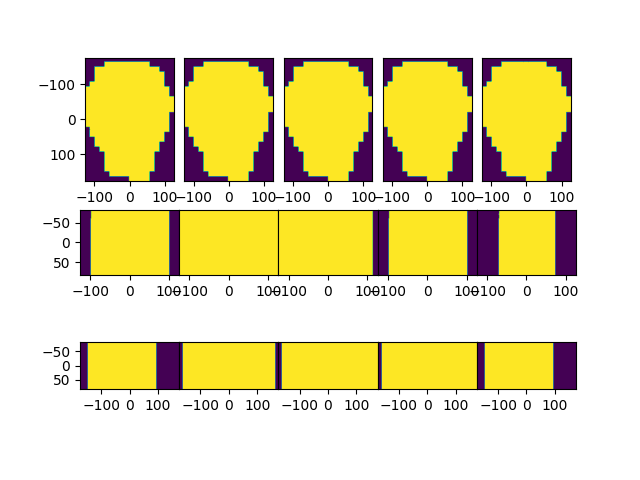

(<Figure size 640x480 with 15 Axes>,
 array([[<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:>]], dtype=object))

In [9]:
emlddmm.draw(W[None])

<IPython.core.display.Javascript object>


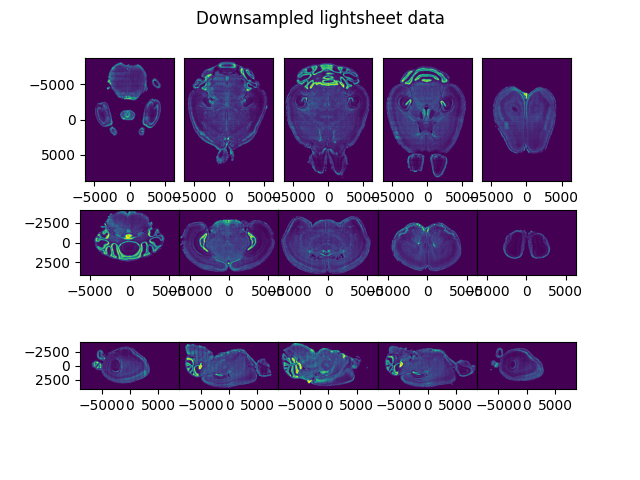

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6
  after removing the cwd from sys.path.


In [10]:
fig,ax = emlddmm.draw(J,xJ,vmin=np.min(J[W[None]>0.9]))
fig.suptitle('Downsampled lightsheet data')
figopts = {'dpi':300,'quality':90}
fig.savefig(output_prefix + 'downsampled.jpg',**figopts)
fig.canvas.draw()

In [11]:
I = []
for atlas_name in atlas_names:
    xI,I_,title,names = emlddmm.read_data(atlas_name)
    I_ = I_.astype(np.float32)
    I_ /= np.mean(np.abs(I_))
    I.append(I_)
    
I = np.concatenate(I)    
dI = [x[1] - x[0] for x in xI]
XI = np.meshgrid(*xI,indexing='ij')
I,xI = fix_shape(I,xI)

xI0 = [ np.copy(x)for x in xI]
I0 = np.copy(I)

<IPython.core.display.Javascript object>


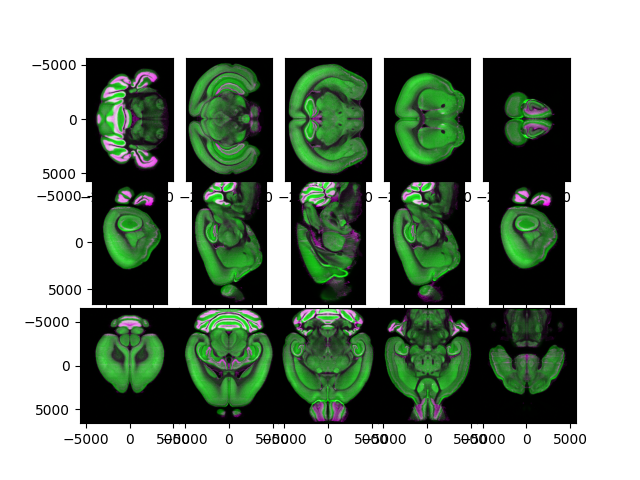

In [12]:
fig,ax = emlddmm.draw(I,xI,vmin=0)
fig.canvas.draw()

<IPython.core.display.Javascript object>


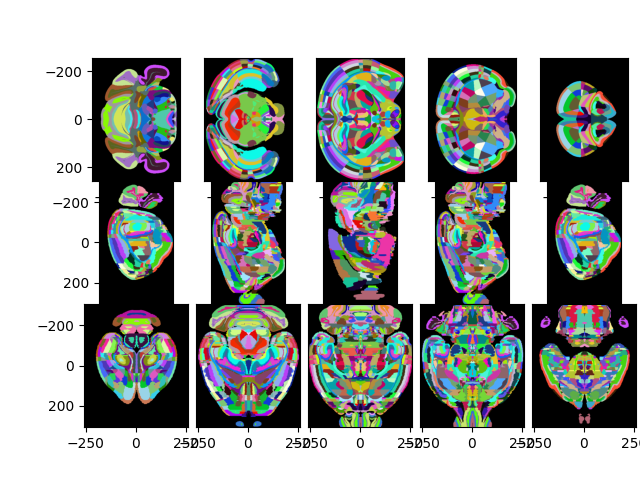

In [13]:
# next is to transforom the high resolution data
xS,S,title,names = emlddmm.read_data(seg_name)
# we want to visuze the above with S
labels,inds = np.unique(S,return_inverse=True)

colors = np.random.rand(len(labels),3)
colors[0] = 0.0

RGB = colors[inds].reshape(S.shape[1],S.shape[2],S.shape[3],3).transpose(-1,0,1,2)
#RGB = np.zeros((3,S.shape[1],S.shape[2],S.shape[3]))

#for i,l in enumerate(labels):
#    RGB[:,S[0]==l] = colors[i][...,None]
fig,ax = emlddmm.draw(RGB)
plt.subplots_adjust(wspace=0,hspace=0,right=1)
fig.canvas.draw()

In [14]:
# question, do they line up, given that they are different resolutions?
# FIXED
[x[1] - x[0] for x in xS]

[20.0, 20.0, 20.0]

# Initial preprocessing



## Target preprocessing

<IPython.core.display.Javascript object>


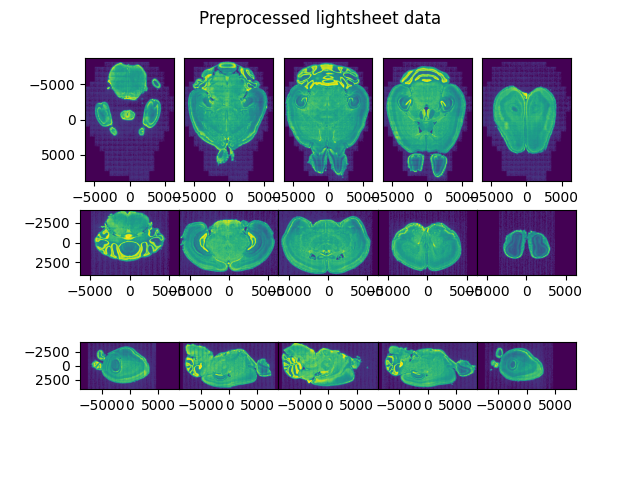

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6
  if sys.path[0] == '':


<IPython.core.display.Javascript object>


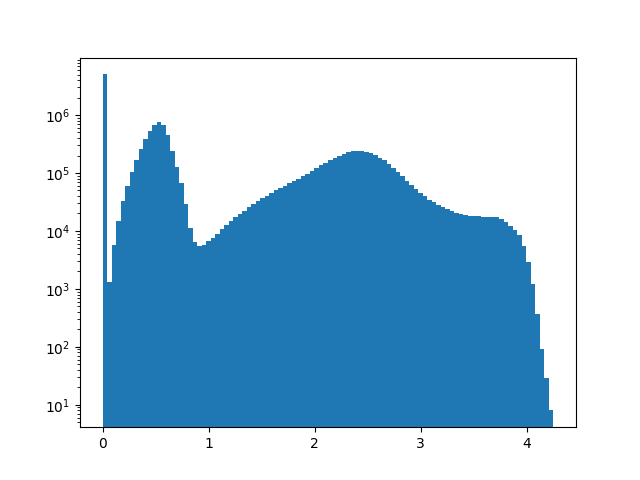

In [15]:
# background
J = J0 - np.quantile(J0[W[None]>0.9],0.1)
J[J<0] = 0
# adjust dynamic range
J = J**0.25

# adjust mean value
J /= np.mean(np.abs(J))
fig,ax = emlddmm.draw(J,xJ,vmin=0)
fig.canvas.draw()
fig.suptitle('Preprocessed lightsheet data')
fig.savefig(output_prefix + 'processed.jpg',**figopts)


fig,ax = plt.subplots()
ax.hist(J.ravel(),100,log=True)
fig.canvas.draw()

## Atlas preprocessing


In [16]:
# pad
# since I will downsample by 4, I want to pad with 4x4x4
npad = 4
I = np.pad(I0,  ((0,0),(npad,npad),(npad,npad),(npad,npad)) )
for i in range(npad):
    xI = [ np.concatenate(   (x[0][None]-d,x,x[-1][None]+d)   ) for d,x in zip(dI,xI0)]


In [17]:
# adjust nissl image dynamic range
I[0] = I[0]**0.5
I[0] /= np.mean(np.abs(I[0]))
I[1] /= np.mean(np.abs(I[1]))

<IPython.core.display.Javascript object>


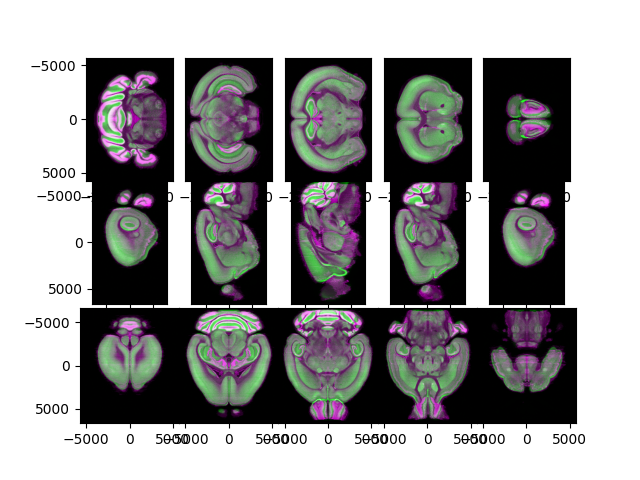

In [18]:
fig,ax = emlddmm.draw(I,xI,vmin=0)
fig.canvas.draw()

# Registration

/home/dtward/data/csh_data/emlddmm/emlddmm.py:2664: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  X = torch.as_tensor(X,dtype=self.data.dtype,device=self.data.device)


<IPython.core.display.Javascript object>


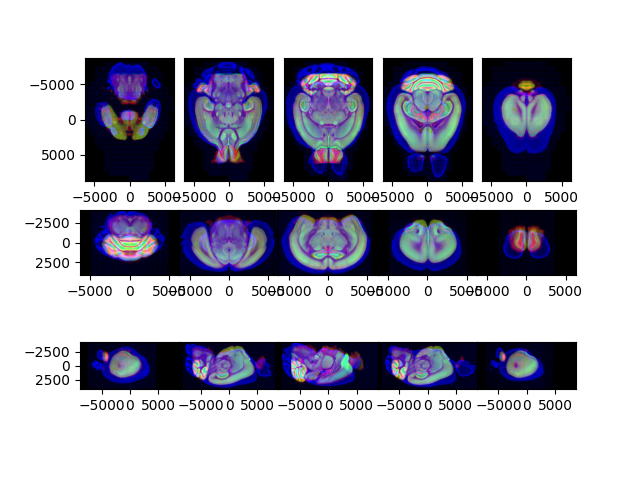

In [19]:
# initial affine
A0 = np.eye(4)
# make sure to keep sign of Jacobian
#A0 = np.diag((1.3,1.3,1.3,1.0))@A0
# flip x0,x1
A0 = np.array([[0.0,-1.0,0.0,0.0],[1.0,0.0,0.0,0.0],[0.0,0.0,1.0,0.0],[0.0,0.0,0.0,1.0]])@A0
# flip x0,x2
A0 = np.array([[0.0,0.0,-1.0,0.0],[0.0,1.0,0.0,0.0],[1.0,0.0,0.0,0.0],[0.0,0.0,0.0,1.0]])@A0
# flip x1,x2
#A0 = np.array([[-1.0,0.0,0.0,0.0],[0.0,0.0,1.0,0.0],[0.0,1.0,0.0,0.0],[0.0,0.0,0.0,1.0]])@A0
# flip 
#A0 = np.diag((1.0,-1.0,-1.0,1.0))@A0
# shift
#A0[0,-1] = +3500 # left right, positive will cut off the missing hemisphere as appropriate
#A0[1,-1] = -2500 # AP, negative will cut off the nose
#A0[2,-1] = -1000 # SI, negative will move the venttral surface toward the boundary

XJ = np.meshgrid(*xJ,indexing='ij')
A0[:3,-1] = np.mean(XJ,axis=(-1,-2,-3))

# check it
tform = emlddmm.Transform(A0,direction='b')
AI = emlddmm.apply_transform_float(xI,I,tform.apply(XJ))
fig,ax = emlddmm.draw(np.concatenate((AI[:2],J)),xJ,vmin=0)
fig.canvas.draw()


<IPython.core.display.Javascript object>


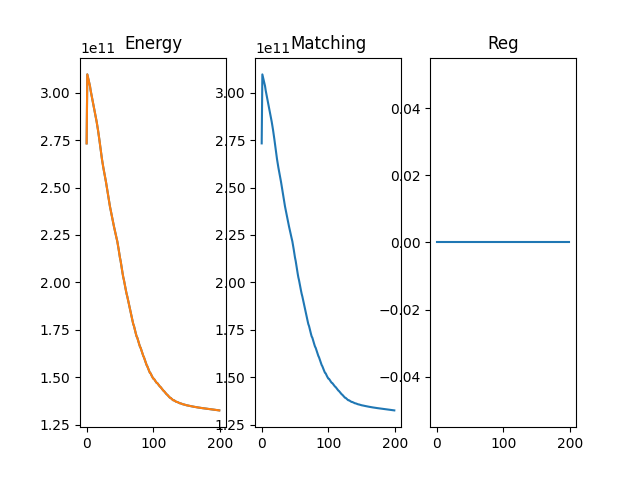

<IPython.core.display.Javascript object>


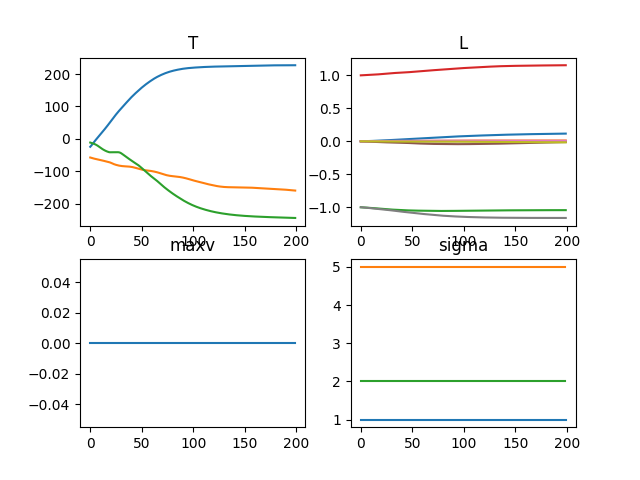

<IPython.core.display.Javascript object>


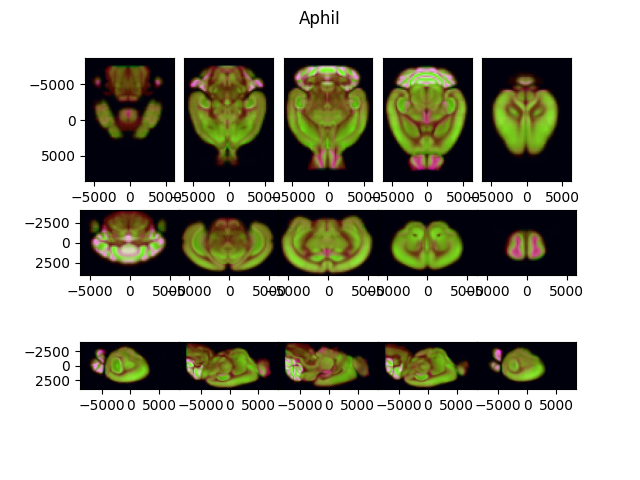

<IPython.core.display.Javascript object>


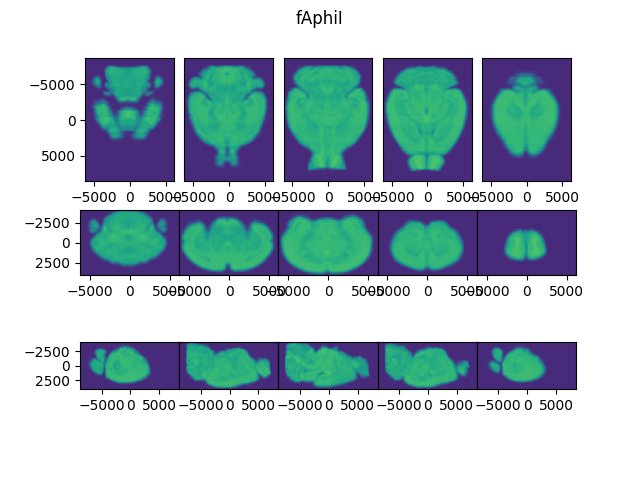

<IPython.core.display.Javascript object>


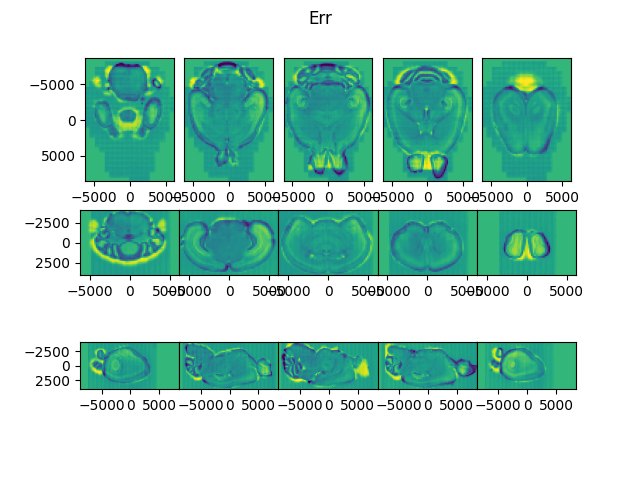

<IPython.core.display.Javascript object>


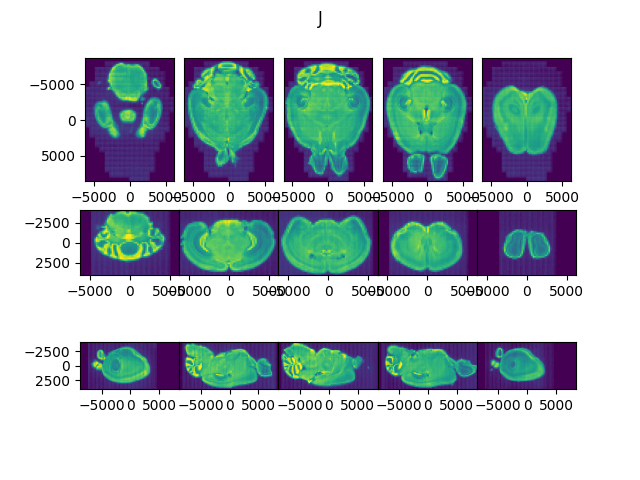

<IPython.core.display.Javascript object>


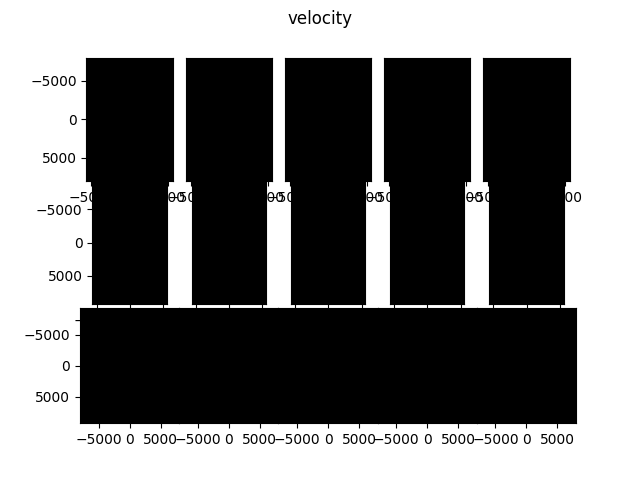

<IPython.core.display.Javascript object>


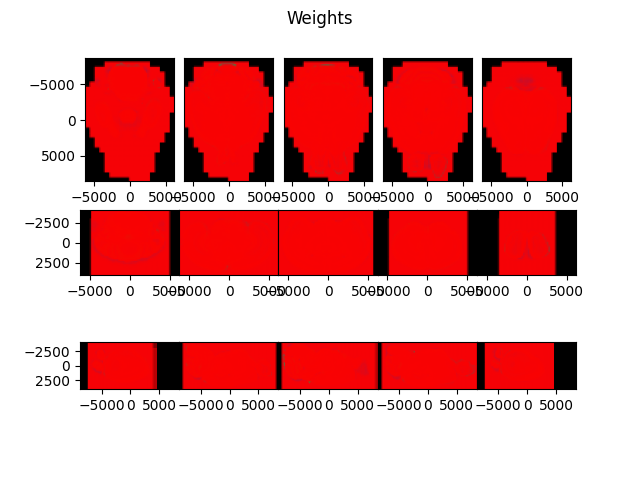

/home/dtward/data/csh_data/emlddmm/emlddmm.py:100: RuntimeWarning: invalid value encountered in true_divide
  J /= (vmax[:,None,None,None] - vmin[:,None,None,None])


In [20]:
# now we want to register
config0 = {
    'device':device,
    'dtype':torch.float64, # double
    'n_iter':200, 'downI':[4,4,4], 'downJ':[4,4,4],
     'priors':[0.9,0.05,0.05],'update_priors':False,
     'update_muA':0,'muA':[np.quantile(J,0.99)],
     'update_muB':0,'muB':[0.0],
     'update_sigmaM':0,'update_sigmaA':0,'update_sigmaB':0,
     'sigmaM':0.25,'sigmaB':0.5,'sigmaA':1.25,
     'order':1,'n_draw':50,'n_estep':3,'slice_matching':0,'v_start':1000,
     'eA':5e4,'A':A0,'full_outputs':True,
   }
# update my sigmas (august 22)
config0['sigmaM'] = 1.0
config0['sigmaB'] = 2.0
config0['sigmaA'] = 5.0
#W = np.ones_like(J[0])
#W = 1.0 - (J[0]==0)
#I_ = np.stack((I[0],I[1],I[0]**2,I[0]*I[1],I[1]**2,))
#I_ = np.stack((I[2],I[0],I[1],I[0]**2,I[0]*I[1],I[1]**2))
#I_ = np.stack((I[0],I[1],I[0]*I[1],I[0]**2,I[1]**2)) # I don't need I[2]
I_ = np.stack((I[0]-np.mean(I[0]),I[1]-np.mean(I[1]),
               (I[0]-np.mean(I[0]))**2,
               (I[0]-np.mean(I[0]))*(I[1]-np.mean(I[1])),
               (I[1]-np.mean(I[0]))**2,))

out = emlddmm.emlddmm(xI=xI,I=I_,xJ=xJ,J=J, W0=W, **config0)

<IPython.core.display.Javascript object>


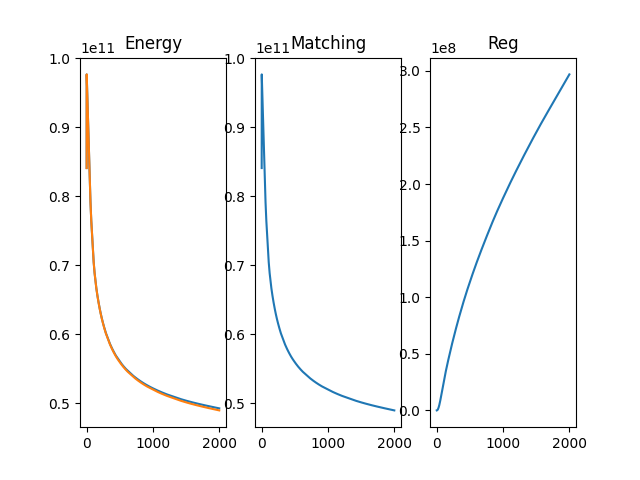

<IPython.core.display.Javascript object>


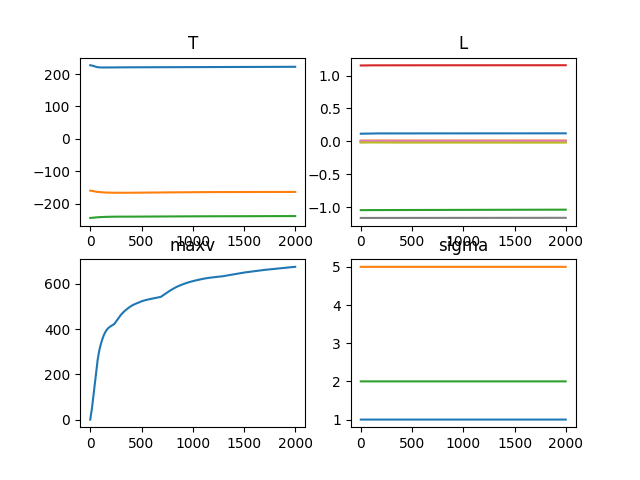

<IPython.core.display.Javascript object>


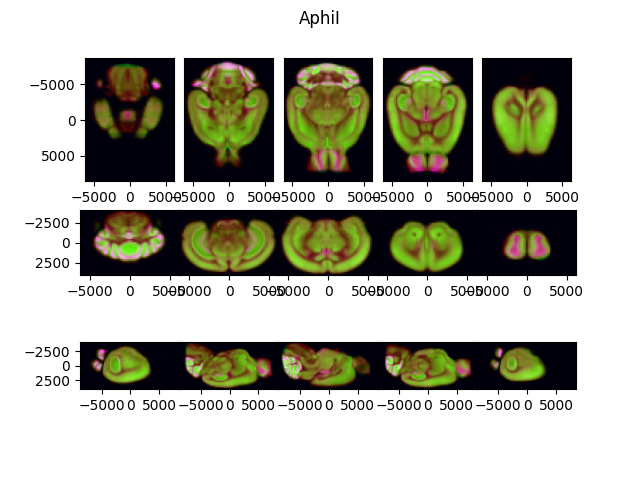

<IPython.core.display.Javascript object>


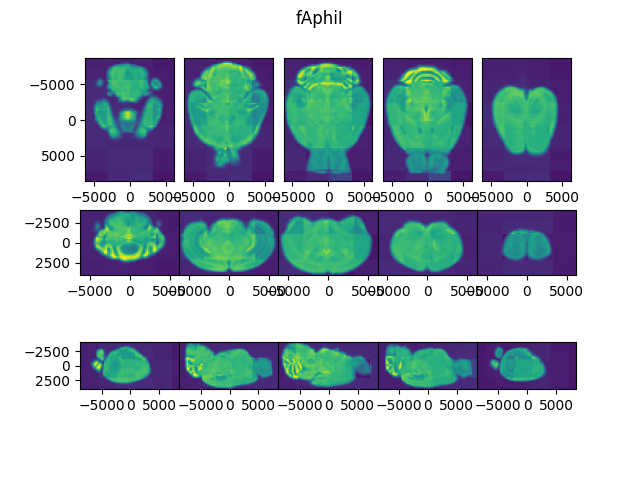

/home/dtward/data/csh_data/emlddmm/emlddmm.py:1075: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figErr = plt.figure()


<IPython.core.display.Javascript object>


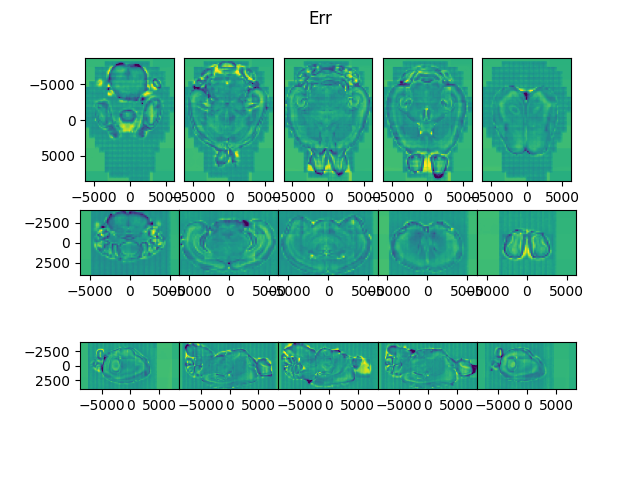

<IPython.core.display.Javascript object>


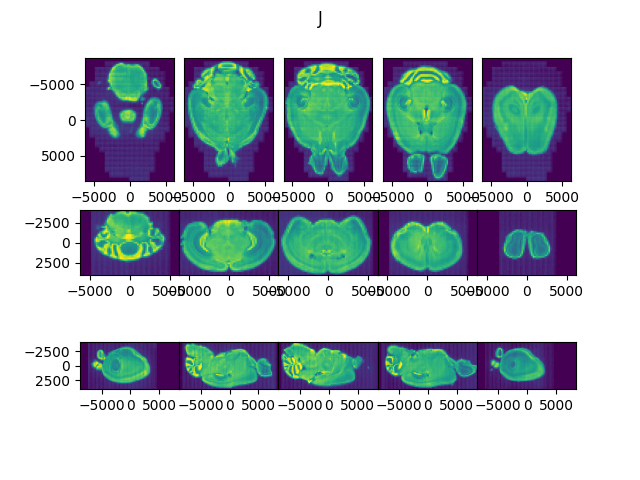

<IPython.core.display.Javascript object>


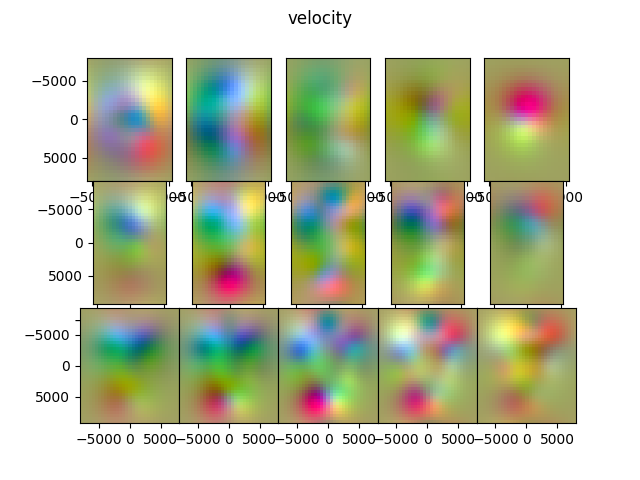

<IPython.core.display.Javascript object>


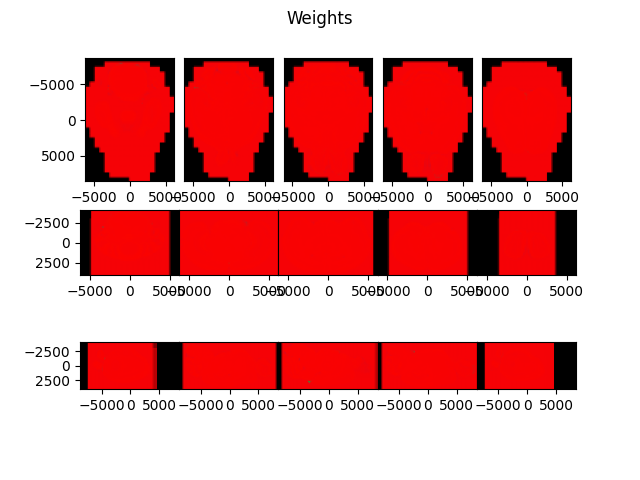

Iteration 80, linear oscilating, reducing eA to 4500.0
Iteration 270, linear oscilating, reducing eA to 4050.0
Iteration 290, translation oscilating, reducing eA to 3645.0


In [21]:
# second run, with deformation
config1 = dict(config0)
config1['A'] = out['A']
config1['eA'] = config0['eA']*0.1
config1['a'] = 1000.0
config1['sigmaR'] = 5e4 # 1e4 gave really good results, but try 2e4, also good, I showed this in my slides
config1['n_iter']= 2000
config1['v_start'] = 0
config1['ev'] = 1e-2
config1['ev'] = 2e-3 # reduce since I decreased sigma
config1['v_res_factor'] = config1['a']/dI[0]/2 # what is the resolution of v, as a multiple of that in I
config1['local_contrast'] = [32,32,32]
config1['local_contrast'] = [16,16,16]
#config1['device'] = config0['device']

#I_ = np.stack((I[2],I[0],I[1],I[0]**2,I[0]*I[1],I[1]**2,))

# note this approach has an issue with background being black
#I_ = np.stack((I[2],I[0]-np.mean(I[0]),I[1]-np.mean(I[1]),
#               (I[0]-np.mean(I[0]))**2,
#               (I[0]-np.mean(I[0]))*(I[1]-np.mean(I[1])),
#               (I[1]-np.mean(I[0]))**2,))
I_ = np.stack((I[0]-np.mean(I[0]),I[1]-np.mean(I[1]),
               (I[0]-np.mean(I[0]))**2,
               (I[0]-np.mean(I[0]))*(I[1]-np.mean(I[1])),
               (I[1]-np.mean(I[0]))**2,))


out1 = emlddmm.emlddmm(xI=xI,I=I_,xJ=xJ,J=J, W0=W, **config1)

/home/dtward/data/csh_data/emlddmm/emlddmm.py:991: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  v = torch.tensor(v,device=device,dtype=dtype)


<IPython.core.display.Javascript object>


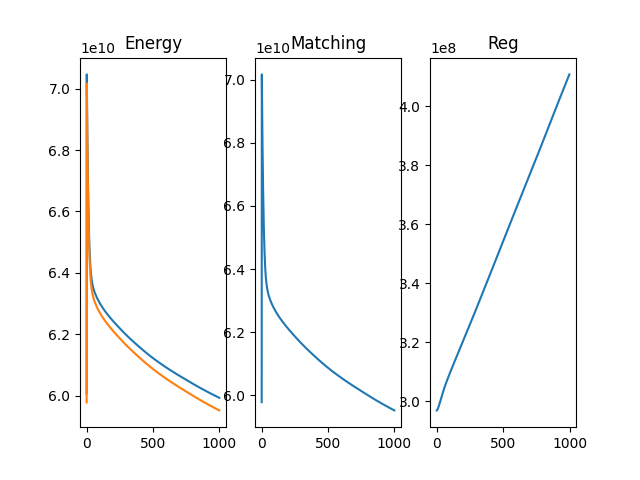

<IPython.core.display.Javascript object>


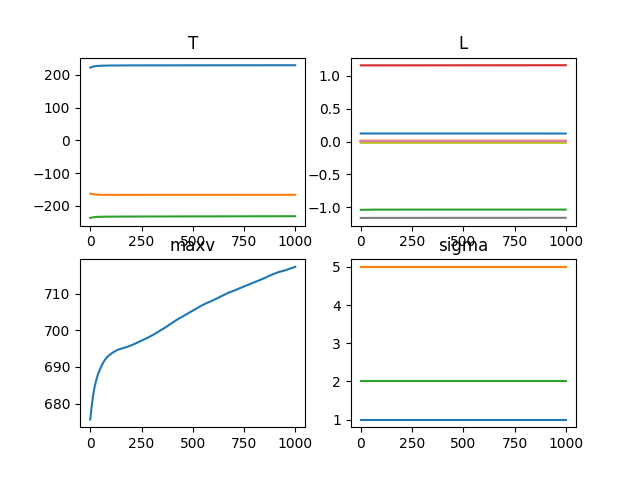

<IPython.core.display.Javascript object>


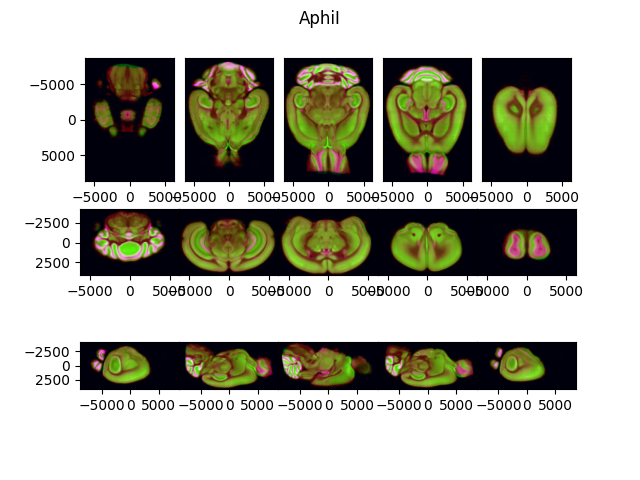

<IPython.core.display.Javascript object>


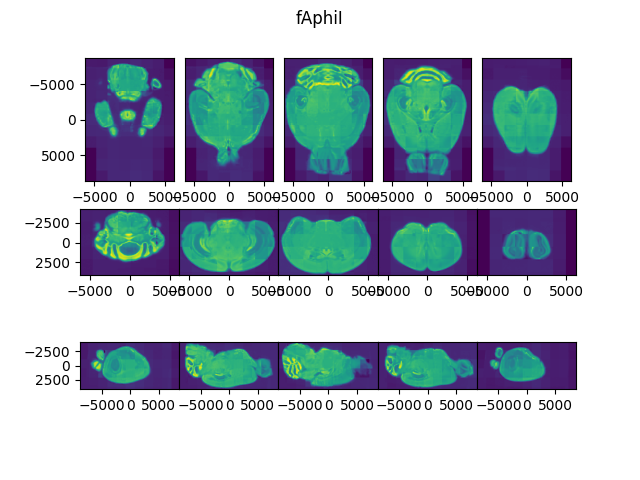

<IPython.core.display.Javascript object>


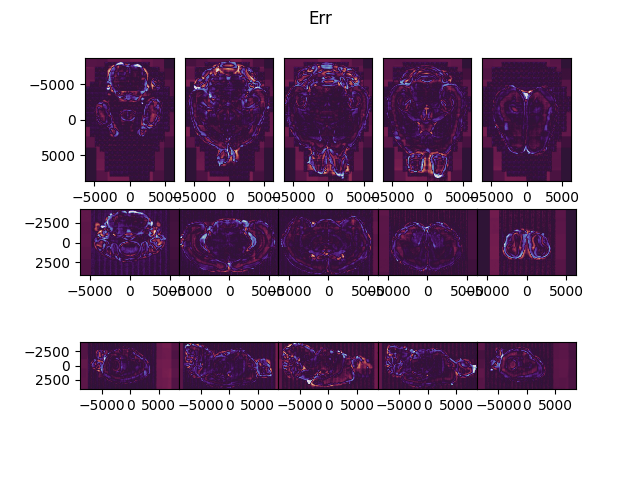

<IPython.core.display.Javascript object>


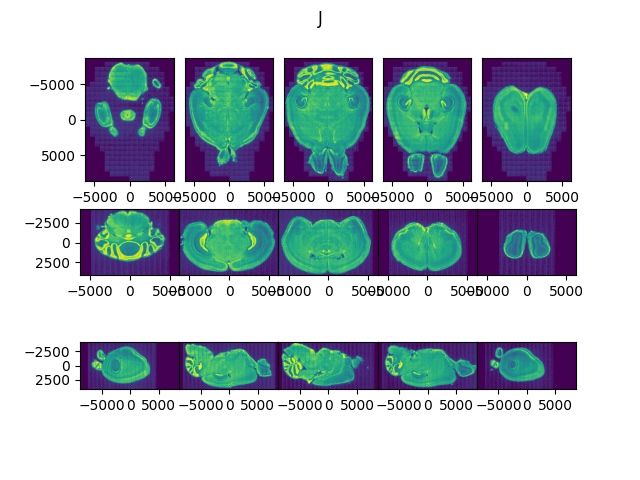

<IPython.core.display.Javascript object>


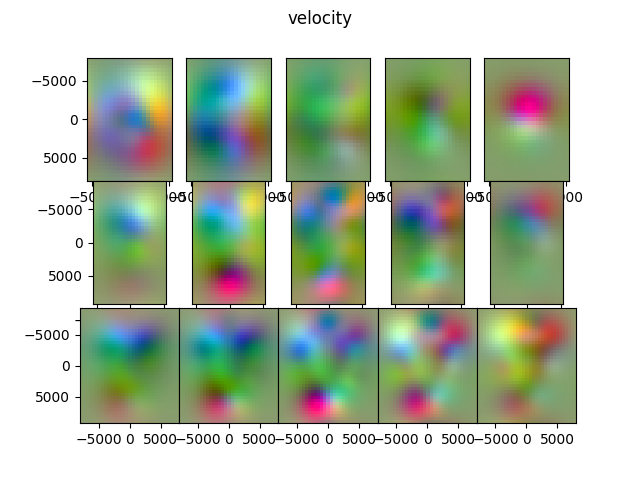

<IPython.core.display.Javascript object>


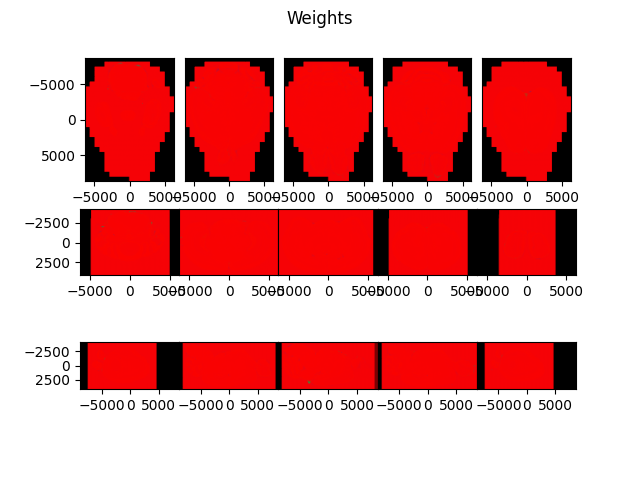

Iteration 490, linear oscilating, reducing eA to 4500.0
Iteration 530, linear oscilating, reducing eA to 4050.0
Iteration 830, linear oscilating, reducing eA to 3645.0


In [22]:
imp.reload(emlddmm)
# on the next run we do les downsampling
config2 = dict(config1)
config2['A'] = out1['A']
config2['n_iter']= 1000
config2['v'] = out1['v']
config2['downI'] = [2,2,2]
config2['downJ'] = [2,2,2]
# there seems to be an issue with the initial velocity
# when I run this twice, I'm reusing it
out2 = emlddmm.emlddmm(xI=xI,I=I_,xJ=xJ,J=J, W0=W, **config2)
# the matching energy here is way way lower, why would that be?

In [23]:
# save the outputs
np.save(output_prefix+savename,np.array([out2],dtype=object))

In [24]:
out2['figI'].savefig(output_prefix + 'transformed.jpg',**figopts)
out2['figfI'].savefig(output_prefix + 'contrast.jpg',**figopts)
out2['figErr'].savefig(output_prefix + 'err.jpg',**figopts)

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6
  """Entry point for launching an IPython kernel.
/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6
  
/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6
  This is separate from the ipykernel package so we can avoid doing imports until


In [25]:
fig = out2['figErr']
axs = fig.get_axes()
for ax in axs:
    ims = ax.get_images()
    for im in ims:
        im.set_cmap('twilight')
        clim = im.get_clim()
        lim = np.max(np.abs(clim))
        im.set_clim(np.array((-1,1))*lim)
fig.canvas.draw()
fig.savefig(output_prefix + 'err.jpg',**figopts)

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6
  # This is added back by InteractiveShellApp.init_path()


# Prepare some visualizations

In [26]:
# compute transform for atlas and labels
deformation = emlddmm.Transform(out2['v'],domain=out2['xv'],direction='b')
affine = emlddmm.Transform(out2['A'],direction='b')
tform = emlddmm.compose_sequence([affine,deformation],XJ)

In [27]:
# transform the atlas and labels, notice different domains
It = emlddmm.apply_transform_float(xI,I,tform).cpu().numpy()
RGBt = emlddmm.apply_transform_float(xS,RGB,tform).cpu().numpy()
St = emlddmm.apply_transform_int(xS,S,tform,double=True,padding_mode='zeros').cpu().numpy()

<IPython.core.display.Javascript object>


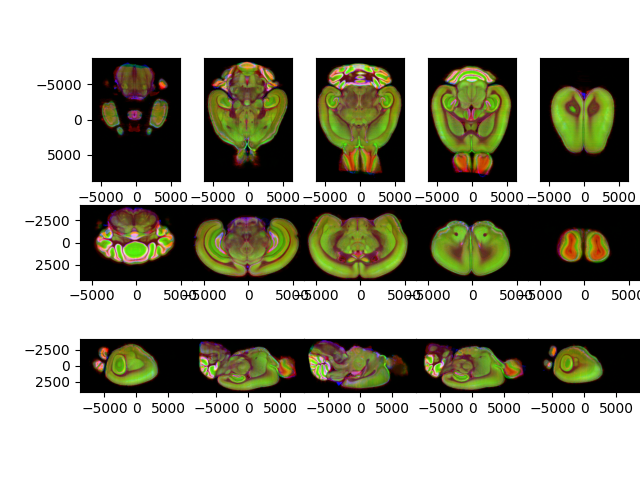

In [28]:
#fig,ax = emlddmm.draw(np.stack((It[0]*0.5,It[1]*0.5,Jsave[0]*1.5)),xJ,vmin=0,vmax=4)
#fig.subplots_adjust(wspace=0,hspace=0,right=1)
fig,ax = emlddmm.draw(np.stack((It[0]*0.5,It[1]*0.5,J0[0]*1.5)),xJ,)
fig.subplots_adjust(wspace=0,hspace=0,right=1)
fig.savefig(output_prefix + 'IJsave.jpg')

<IPython.core.display.Javascript object>


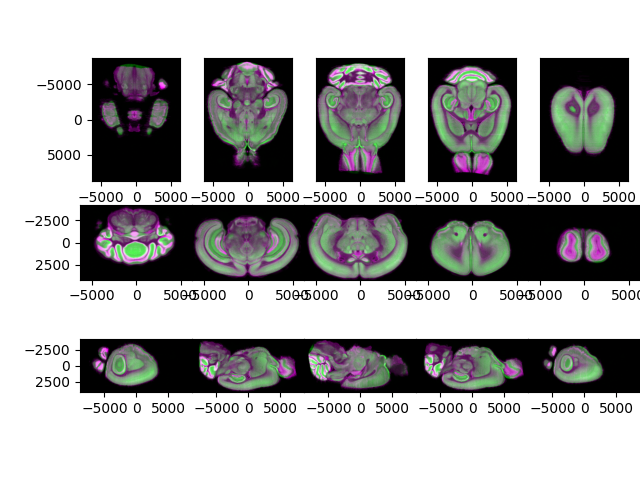

In [29]:
fig,ax = emlddmm.draw(It,xJ)
fig.subplots_adjust(wspace=0,hspace=0,right=1)
fig.savefig(output_prefix + 'Isave.jpg')

<IPython.core.display.Javascript object>


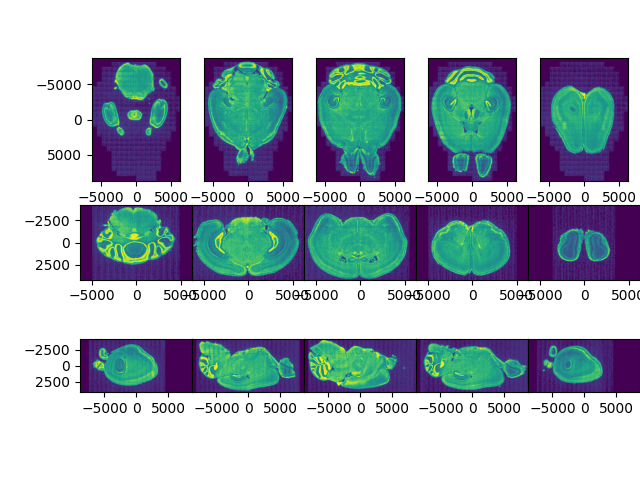

In [30]:
fig,ax = emlddmm.draw(J,xJ)
plt.subplots_adjust(wspace=0,hspace=0,right=1)
fig.savefig(output_prefix + 'Jsave.jpg')

In [31]:
# transform the target to atlas
# for visualizatoin, we want to sample at xS so we can view it relative to the
XS = np.stack(np.meshgrid(*xS,indexing='ij'))
imp.reload(emlddmm)
deformation = emlddmm.Transform(out2['v'],domain=out2['xv'],direction='f')
affine = emlddmm.Transform(out2['A'],direction='f')
tformi = emlddmm.compose_sequence([deformation,affine,],XS)
#J_ = J0**0.25
J_ = np.copy(J)
Jt = emlddmm.apply_transform_float(xJ,J_,tformi,padding_mode='zeros').cpu().numpy()

<IPython.core.display.Javascript object>


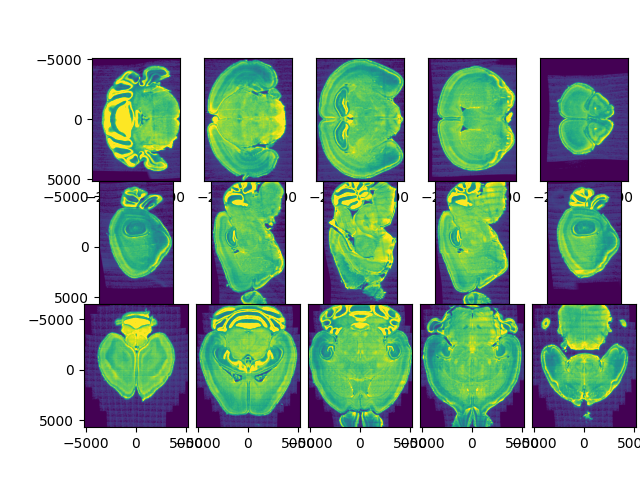

In [32]:
# view the transformed target
fig,ax = emlddmm.draw(Jt,xS,vmin=np.quantile(J_,0.02),vmax=np.quantile(J_,0.98))
fig.subplots_adjust(wspace=0,hspace=0,right=1)

<IPython.core.display.Javascript object>


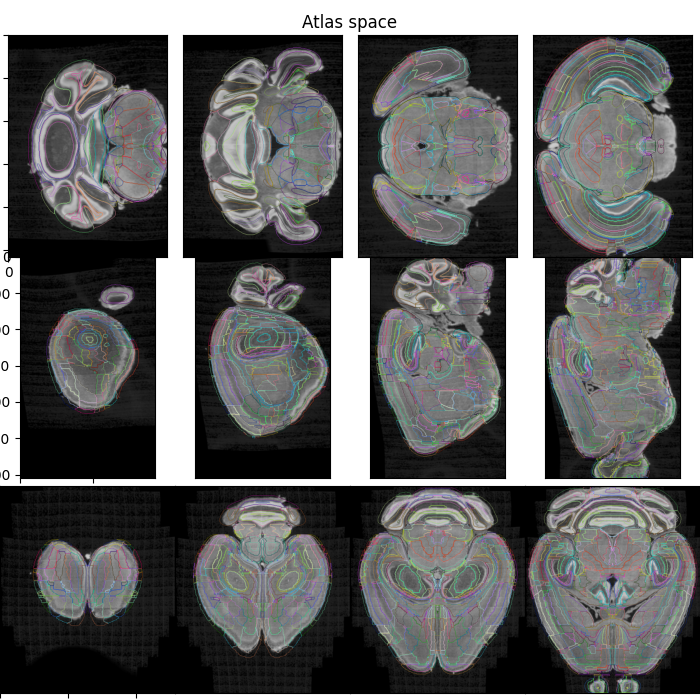

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:83: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6


In [33]:
# view the transformed target with labels
minval = 1.5
maxval = 2.9
minval = 0.0
maxval = 5.0
alpha = 0.3
alpha = 0.75
fig = plt.figure(figsize=(7,7))
n = 4
slices = np.round(np.linspace(0,I.shape[1],n+2)[1:-1]).astype(int)
for i in range(n):
    ax = fig.add_subplot(3,n,i+1)    
    
    # get slices
    RGB_ = RGB[:,slices[i]].transpose(1,2,0)
    S_ = S[0,slices[i]]
    Jt_ = np.copy(Jt[0,slices[i]])
    #Jt_ -= np.quantile(Jt_,0.01)
    Jt_ -= minval
    #Jt_ /= np.quantile(Jt_,0.99)
    Jt_ /= maxval-minval
    # find boundaries
    border = S_ != np.roll(S_,shift=1,axis=0)
    border |= S_ != np.roll(S_,shift=-1,axis=0)
    border |= S_ != np.roll(S_,shift=1,axis=1)
    border |= S_ != np.roll(S_,shift=-1,axis=1)
    
    # draw
    ax.imshow(alpha*border[...,None]*RGB_ + ((1-alpha*border)*Jt_)[...,None])
    if i>0:
        ax.set_xticks([])
        ax.set_yticks([])
    
slices = np.round(np.linspace(0,I.shape[2],n+2)[1:-1]).astype(int)
for i in range(n):
    ax = fig.add_subplot(3,n,i+1 + n)    
    
    # get slices
    RGB_ = RGB[:,:,slices[i]].transpose(1,2,0)
    S_ = S[0,:,slices[i]]
    Jt_ = np.copy(Jt[0,:,slices[i]])
    #Jt_ -= np.quantile(Jt_,0.01)
    Jt_ -= minval
    #Jt_ /= np.quantile(Jt_,0.99)
    Jt_ /= maxval-minval
    # find boundaries
    border = S_ != np.roll(S_,shift=1,axis=0)
    border |= S_ != np.roll(S_,shift=-1,axis=0)
    border |= S_ != np.roll(S_,shift=1,axis=1)
    border |= S_ != np.roll(S_,shift=-1,axis=1)
    
    # draw
    ax.imshow(alpha*border[...,None]*RGB_ + ((1-alpha*border)*Jt_)[...,None])
    if i>0:
        ax.set_xticks([])
        ax.set_yticks([])

slices = np.round(np.linspace(0,I.shape[3],n+2)[1:-1]).astype(int)
for i in range(n):
    ax = fig.add_subplot(3,n,i+1 + n+n)    
    
    # get slices
    RGB_ = RGB[:,:,:,slices[i]].transpose(1,2,0)
    S_ = S[0,:,:,slices[i]]
    Jt_ = np.copy(Jt[0,:,:,slices[i]])
    #Jt_ -= np.quantile(Jt_,0.01)
    Jt_ -= minval
    #Jt_ /= np.quantile(Jt_,0.99)
    Jt_ /= maxval-minval
    # find boundaries
    border = S_ != np.roll(S_,shift=1,axis=0)
    border |= S_ != np.roll(S_,shift=-1,axis=0)
    border |= S_ != np.roll(S_,shift=1,axis=1)
    border |= S_ != np.roll(S_,shift=-1,axis=1)
    
    # draw
    ax.imshow(alpha*border[...,None]*RGB_ + ((1-alpha*border)*Jt_)[...,None])    
    if i>0:
        ax.set_xticks([])
        ax.set_yticks([])
fig.suptitle('Atlas space')
fig.subplots_adjust(wspace=0,hspace=0,left=0.0,right=1,bottom=0,top=0.95)
fig.savefig(output_prefix+'atlas_space.jpg',**figopts)

<IPython.core.display.Javascript object>


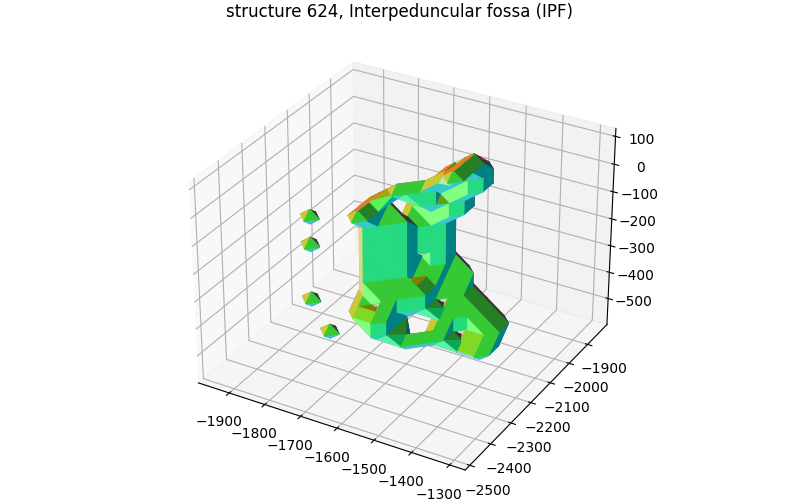

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:76: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6


In [34]:
# view the transformed labels with the target
fig = plt.figure(figsize=(8,5))
slices = np.round(np.linspace(0,J.shape[1],n+2)[1:-1]).astype(int)
for i in range(n):
    ax = fig.add_subplot(3,n,i+1)    
    
    # get slices
    RGB_ = RGBt[:,slices[i]].transpose(1,2,0)
    S_ = St[0,slices[i]]
    Jt_ = np.copy(J[0,slices[i]])
    #Jt_ -= np.quantile(Jt_,0.01)
    Jt_ -= minval
    #Jt_ /= np.quantile(Jt_,0.99)
    Jt_ /= maxval-minval
    # find boundaries
    border = S_ != np.roll(S_,shift=1,axis=0)
    border |= S_ != np.roll(S_,shift=-1,axis=0)
    border |= S_ != np.roll(S_,shift=1,axis=1)
    border |= S_ != np.roll(S_,shift=-1,axis=1)
    
    # draw
    ax.imshow(alpha*border[...,None]*RGB_ + ((1-alpha*border)*Jt_)[...,None])
    if i>0:
        ax.set_xticks([])
        ax.set_yticks([])
    
slices = np.round(np.linspace(0,J.shape[2],n+2)[1:-1]).astype(int)
for i in range(n):
    ax = fig.add_subplot(3,n,i+1 + n)    
    
    # get slices
    RGB_ = RGBt[:,:,slices[i]].transpose(1,2,0)
    S_ = St[0,:,slices[i]]
    Jt_ = np.copy(J[0,:,slices[i]])
    #Jt_ -= np.quantile(Jt_,0.01)
    Jt_ -= minval
    #Jt_ /= np.quantile(Jt_,0.99)
    Jt_ /= maxval-minval
    # find boundaries
    border = S_ != np.roll(S_,shift=1,axis=0)
    border |= S_ != np.roll(S_,shift=-1,axis=0)
    border |= S_ != np.roll(S_,shift=1,axis=1)
    border |= S_ != np.roll(S_,shift=-1,axis=1)
    
    # draw
    ax.imshow(alpha*border[...,None]*RGB_ + ((1-alpha*border)*Jt_)[...,None])
    if i>0:
        ax.set_xticks([])
        ax.set_yticks([])

slices = np.round(np.linspace(0,J.shape[3],n+2)[1:-1]).astype(int)
for i in range(n):
    ax = fig.add_subplot(3,n,i+1 + n+n)    
    
    # get slices
    RGB_ = RGBt[:,:,:,slices[i]].transpose(1,2,0)
    S_ = St[0,:,:,slices[i]]
    Jt_ = np.copy(J[0,:,:,slices[i]])
    #Jt_ -= np.quantile(Jt_,0.01)
    Jt_ -= minval
    #Jt_ /= np.quantile(Jt_,0.99)
    Jt_ /= maxval-minval
    # find boundaries
    border = S_ != np.roll(S_,shift=1,axis=0)
    border |= S_ != np.roll(S_,shift=-1,axis=0)
    border |= S_ != np.roll(S_,shift=1,axis=1)
    border |= S_ != np.roll(S_,shift=-1,axis=1)
    
    # draw
    ax.imshow(alpha*border[...,None]*RGB_ + ((1-alpha*border)*Jt_)[...,None])    
    if i>0:
        ax.set_xticks([])
        ax.set_yticks([])
fig.suptitle('Target space')
fig.subplots_adjust(wspace=0,hspace=0,left=0.0,right=1,bottom=0,top=0.95)
fig.savefig(output_prefix+'target_space.jpg',**figopts)

# Get bounding boxes for striatum or another structure

In [35]:
import requests,csv

In [36]:
# don't do this because we wlil use Yongsoo ontology
'''
# bounding boxes using St
ontology_name = output_prefix + 'allen_ontology.csv'
r = 'http://api.brain-map.org/api/v2/data/query.csv?criteria=model::Structure,\
rma::criteria,[ontology_id$eq1],\
rma::options[order$eq%27structures.graph_order%27][num_rows$eqall]\
'
if True:# not os.path.exists(ontology_name):
    output = requests.get(r)
    with open(ontology_name,'wt') as f:
        f.write(output.text)
'''        

"\n# bounding boxes using St\nontology_name = output_prefix + 'allen_ontology.csv'\nr = 'http://api.brain-map.org/api/v2/data/query.csv?criteria=model::Structure,rma::criteria,[ontology_id$eq1],rma::options[order$eq%27structures.graph_order%27][num_rows$eqall]'\nif True:# not os.path.exists(ontology_name):\n    output = requests.get(r)\n    with open(ontology_name,'wt') as f:\n        f.write(output.text)\n"

In [37]:
parent_column = 7 # 8 for allen, 7 for yongsoo
label_column = 0 # 0 for both
shortname_column = 2# 3 for allen, 2 for yongsoo
longname_column = 1# 2 for allen, 1 for yongsoo
ontology = dict()
with open(ontology_name) as f:
    csvreader = csv.reader(f, delimiter=',', quotechar='"')
    count = 0
    for row in csvreader:        
        if count == 0:
            headers = row
            print(headers)
        else:
            if not row[parent_column]:
                parent = -1
            else:
                parent = int(row[parent_column])
            ontology[int(row[label_column])] = (row[shortname_column],row[longname_column],parent)
        count += 1


['\ufeffid', 'name', 'acronym', 'red', 'green', 'blue', 'structure_order', 'parent_id', 'parent_acronym']


In [38]:
ontology

{0: ('background', 'background', -1),
 997: ('root', 'root', -1),
 8: ('grey', 'Basic cell groups and regions', 997),
 567: ('CH', 'Cerebrum', 8),
 688: ('CTX', 'Cerebral cortex', 567),
 695: ('CTXpl', 'Cortical plate', 688),
 315: ('Isocortex', 'Isocortex', 695),
 184: ('FrA', 'Frontal association cortex', 315),
 68: ('FrA-1', 'Frontal pole, layer 1', 184),
 667: ('FrA-2/3', 'Frontal pole, layer 2/3', 184),
 2325: ('FrA-5', 'Frontal pole, layer 5', 184),
 500: ('M', 'motor cortex', 315),
 985: ('M1', 'Primary motor cortex', 500),
 320: ('M1-1', 'Primary motor cortex, layer 1', 985),
 943: ('M1-2/3', 'Primary motor cortex, layer 2/3', 985),
 648: ('M1-5', 'Primary motor cortex, layer 5', 985),
 844: ('M1-6a', 'Primary motor cortex, layer 6a', 985),
 882: ('M1-6b', 'Primary motor cortex, layer 6b', 985),
 2017: ('FrC3', 'Frontal cortex, area 3', 985),
 2334: ('FrC3-1', 'Frontal cortex, area 3, layer1', 2017),
 2335: ('FrC3-2/3', 'Frontal cortex, area 3, layer2/3', 2017),
 2336: ('FrC3-5

In [39]:
# we need to find all the descendants of a given label
# first we'll get children
children = dict()
for o in ontology:
    parent = ontology[o][-1]
    if parent not in children:
        children[parent] = []
    children[parent].append(o)

In [40]:
# now we go from children to descendents
descendents = dict(children)
for o in descendents:
    for child in descendents[o]:
        if child in descendents: # if I don't do this i get a key error 0
            descendents[o].extend(descendents[child])
descendents[0] = []

In [41]:
descendents_and_self = dict(descendents)
for o in ontology:
    if o not in descendents_and_self:
        descendents_and_self[o] = [o]
    else:
        descendents_and_self[o].append(o)

In [42]:
# or we could just loop through
labels = np.unique(St)
bbox = dict()
for l in labels:
    # skip background
    if l == 0:
        continue
    
    Sl = St == l
    
    # include all the descendents
    for o in descendents_and_self[l]:
        Sl = np.logical_or(Sl,St==o)
    
    
    bbox2 = xJ[2][np.nonzero(np.sum(Sl,(0,1,2))>0)[0][[0,-1]]]
    bbox1 = xJ[1][np.nonzero(np.sum(Sl,(0,1,3))>0)[0][[0,-1]]]
    bbox0 = xJ[0][np.nonzero(np.sum(Sl,(0,2,3))>0)[0][[0,-1]]]
    bbox[l] = (bbox2[0],bbox2[1],bbox1[0],bbox1[1],bbox0[0],bbox0[1],ontology[l][0],ontology[l][1])
    


In [43]:
import pandas as pd
df = pd.DataFrame(bbox).T
bbox_headings = ('x0','x1','y0','y1','z0','z1','short name','long name')
df.columns=bbox_headings
df.index.name = 'id'

In [44]:
df

,x0,x1,y0,y1,z0,z1,short name,long name
id,,,,,,,,
1,-1461.0,889.0,-1907.0,-1557.0,-2349.0,-1949.0,VTM,Ventral tuberomammillary nucleus
2,-4511.0,4089.0,-907.0,2843.0,551.0,1801.0,S1ULp-6b,"Primary somatosensory cortex, upper lip region..."
6,-4211.0,3789.0,-1507.0,1593.0,-1799.0,1201.0,ic,internal capsule
7,-2811.0,2389.0,-4957.0,-3657.0,-2899.0,-1099.0,Pr5,Principal sensory trigeminal nucleus
9,-3011.0,2689.0,-1307.0,-557.0,2451.0,3301.0,S1Tr-6a,"Primary somatosensory cortex, trunk region, la..."
...,...,...,...,...,...,...,...,...
10731,-1861.0,1439.0,-8157.0,-6807.0,-1249.0,351.0,8Cb-mo,"Lobule 8 of the cerebellar vermis, molecular l..."
10732,-2211.0,1789.0,-8257.0,-6257.0,-1649.0,-249.0,9Cb-gr,"Lobule 9 of the cerebellar vermis, granular layer"
10734,-2161.0,1739.0,-8257.0,-6257.0,-1949.0,-299.0,9Cb-mo,"Lobule 9 of the cerebellar vermis, molecular l..."


In [45]:
df.to_csv(output_prefix + 'bboxes.csv')

In [46]:
# TODO, separate left from right in bounding box

In [47]:
# TODO, use a surface instead of bounding box. use marching cubes. figure out file format.

In [48]:
# see link on slack vrml (wireframe objects9-)

In [49]:
def compute_face_normals(verts,faces,normalize=False):
    e1 = verts[faces[:,1]] - verts[faces[:,0]]
    e2 = verts[faces[:,2]] - verts[faces[:,1]]
    n = np.cross(e1,e2)/2.0
    if normalize:
        n /= np.sqrt(np.sum(n**2,1,keepdims=True))
        pass
    return n

In [50]:
# TODO for daniel, write out surfaces that are parent and all the descendents (february 15)

In [69]:
from skimage.measure import marching_cubes
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
oJ = [x[0] for x in xJ]
labels = np.unique(St)
bbox = dict()

In [57]:
1

1

In [70]:
for l in ontology:
    print(f'starting {l}')
    # skip background
    if l == 0:
        print('skipping 0')
        continue
    
    Sl = St == l
    count0 = np.sum(Sl)
    # do marching cubes
    print('adding ',end='')
    for o in descendents_and_self[l]:
        print(f'{o},',end='')
        Sl = np.logical_or(Sl,St==o)
    count1 = np.sum(Sl)
    if count0 != count1:
        print(f'Structure {l} shows differences')
    if count1 == 0:
        print(f'no voxels for structure {l}')
        continue
    
    verts,faces,normals,values = marching_cubes(Sl[0]*1.0,level=0.5,spacing=dJ)
    # deal with the offsets
    verts += oJ
    
    # let's save this
    readme = 'Data are saved in ZYX order'
    np.savez(output_prefix + f'structure_AND_DESCENDENTS_{l:012d}_surface.npz',verts=verts,faces=faces,normals=normals,values=values,readme=readme)
    
    surf = Poly3DCollection(verts[faces])
    n = compute_face_normals(verts,faces,normalize=True)
    surf.set_color(n*0.5+0.5)
    fig.clf()
    ax = fig.add_subplot(projection='3d')
    ax.add_collection3d(surf)
    xlim = (np.min(verts[:,0]),np.max(verts[:,0]))
    ylim = (np.min(verts[:,1]),np.max(verts[:,1]))
    zlim = (np.min(verts[:,2]),np.max(verts[:,2]))
    # fix aspect ratio
    r = [np.diff(x) for x in (xlim,ylim,zlim)]
    rmax = np.max(r)
    c = [np.mean(x) for x in (xlim,ylim,zlim)]
    xlim = (c[0]-rmax/2,c[0]+rmax/2)
    ylim = (c[1]-rmax/2,c[1]+rmax/2)
    zlim = (c[2]-rmax/2,c[2]+rmax/2)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_zlim(zlim)
    
    ax.set_title(f'structure {l}, {ontology[l][1]} ({ontology[l][0]})')    
    fig.canvas.draw()
    fig.savefig(output_prefix + f'structure_AND_DESCENDENTS_{l:012d}_surface.jpg')

starting 0
skipping 0
starting 997
adding 8,1009,2155,73,1024,567,512,343,967,960,983,1000,991,81,124,129,140,145,164,1032,1040,624,688,623,528,519,1129,313,1065,949,840,848,832,911,901,798,933,2222,808,917,813,792,871,2275,744,752,728,776,784,896,760,877,863,941,768,824,98,108,2373,2219,153,1063,1071,1087,1095,1103,1112,1119,3,11,34,43,65,695,703,477,803,645,1073,989,91,2281,549,1097,2107,339,323,2112,2101,348,771,354,1016,21,900,2317,916,336,117,125,2040,62,158,93,229,1131,1116,2461,413,948,237,932,293,326,78,1123,956,1108,971,986,6,924,190,198,2169,1092,14,2109,102,1060,397,908,940,1099,37,301,54,341,46,1083,315,698,1089,16,583,942,131,295,319,780,485,493,275,278,1022,1031,835,342,826,809,912,976,984,928,936,944,951,957,968,1007,1056,1064,1025,1033,1041,1049,2244,2245,2239,2240,2241,2242,846,2247,2414,864,856,157,141,467,290,10671,2476,4,580,271,874,2163,460,2108,2147,2131,2181,2154,381,749,246,795,2123,50,67,587,2152,2156,1100,616,214,2136,35,975,115,757,231,2168,66,75,58,615,374,1

adding 567,512,343,688,623,528,519,1129,313,1065,695,703,477,803,645,1073,989,91,2281,549,1097,2107,339,323,2112,2101,348,771,354,315,698,1089,16,583,942,131,295,319,780,485,493,275,278,1022,1031,835,342,826,809,912,976,984,928,936,944,951,957,968,1007,1056,1064,1025,1033,1041,1049,2244,2245,2239,2240,2241,2242,846,2247,2414,864,856,157,141,467,290,10671,2476,4,580,271,874,2163,460,2108,2147,2131,2181,2154,381,749,246,795,2123,50,67,587,2152,2156,1100,616,214,2136,35,975,115,757,231,2168,66,75,58,615,374,1052,165,1132,987,2166,1117,2246,386,370,379,184,500,453,44,1057,677,247,669,31,972,714,95,254,22,541,922,895,507,151,159,589,814,961,619,631,788,566,1080,822,2002,2003,952,966,2085,2426,2068,2052,2060,303,311,451,327,334,2086,2087,2088,672,56,998,754,242,310,333,2009,23,292,536,1105,403,298,2028,2371,2027,2013,904,581,2308,351,287,10707,10705,10710,10708,10713,10711,992,1001,1091,10725,10723,10728,10726,10731,10729,10734,10732,10737,10735,10674,10672,10677,10675,10680,10678,10683,1068

adding 688,623,695,703,477,803,315,698,1089,16,583,942,131,295,319,780,485,493,275,278,1022,1031,835,342,826,809,184,500,453,44,1057,677,247,669,31,972,714,95,254,22,541,922,895,507,151,159,589,814,961,619,631,788,566,1080,822,2002,2003,952,966,2085,2426,2068,2052,2060,303,311,451,327,334,2086,2087,2088,672,56,998,754,242,310,333,2009,23,292,536,1105,403,298,2028,2371,2027,2013,904,581,2308,351,287,68,667,2325,985,993,322,378,707,747,556,827,1054,1081,36,180,148,187,638,662,897,1106,1010,1058,857,849,1011,1002,1018,2170,2096,385,2345,39,48,171,195,304,363,84,132,723,731,738,2331,2332,2333,104,111,119,879,886,2056,2057,2082,2286,97,1127,234,289,729,786,335,368,540,692,888,836,427,988,977,1045,212,220,228,236,244,188,196,204,2021,167,175,160,183,191,199,597,1034,1042,1050,1059,605,1067,1075,1082,496,535,360,646,267,2019,276,284,291,2024,260,268,1139,639,647,408,416,424,1140,1141,1142,375,726,982,19,909,1084,843,1037,502,2376,2491,2492,2496,2495,2001,2050,2074,2006,2007,2012,2372,481,489,

adding 184,500,453,44,1057,677,247,669,31,972,714,95,254,22,541,922,895,68,667,2325,985,993,322,378,707,747,556,827,1054,1081,36,180,148,187,638,662,897,1106,1010,1058,857,849,1011,1002,1018,2170,2096,385,2345,39,48,171,195,304,363,84,132,723,731,738,2331,2332,2333,104,111,119,879,886,2056,2057,2082,2286,97,1127,234,289,729,786,335,368,540,692,888,836,427,988,977,1045,320,943,648,844,882,2017,656,962,767,1021,1085,2338,793,329,337,345,2000,2352,2041,369,361,873,806,1035,1090,862,893,527,600,678,252,156,243,735,251,816,847,954,1005,959,755,990,1023,520,598,402,409,425,2097,394,533,593,821,721,778,33,305,2098,2133,2346,2347,2348,2349,2350,935,211,1015,919,927,588,296,772,810,819,448,412,630,440,488,484,524,582,620,910,2320,2321,2322,2323,2324,996,328,1101,783,831,2020,120,163,344,314,355,704,694,800,675,699,442,434,545,610,274,330,2132,2066,2067,2381,2382,2383,2384,2385,2386,2387,2388,2389,2390,2391,2392,2402,2403,2404,2405,2406,2407,2396,2397,2398,2399,2400,2401,2334,2335,2336,2337,2351

adding 421,starting 973
adding 973,starting 573
adding 573,starting 613
adding 613,starting 74
adding 74,starting 121
adding 121,starting 425
adding 750,269,869,902,377,393,425,Structure 425 shows differences
starting 750
adding 750,starting 269
adding 269,starting 869
adding 869,starting 902
adding 902,starting 377
adding 377,starting 393
adding 393,starting 2096
adding 2097,394,533,2393,2409,2410,2411,2412,2413,281,1066,401,433,1046,441,805,41,501,565,257,469,2096,Structure 2096 shows differences
starting 2097
adding 2393,2409,2410,2411,2412,2413,2097,Structure 2097 shows differences
starting 2393
adding 2393,starting 2409
adding 2409,starting 2410
adding 2410,starting 2411
adding 2411,starting 2412
adding 2412,starting 2413
adding 2413,starting 394
adding 281,1066,401,433,1046,441,394,Structure 394 shows differences
starting 281
adding 281,starting 1066
adding 1066,starting 401
adding 401,starting 433
adding 433,starting 1046
adding 1046,starting 441
adding 441,starting 533
adding 8

adding 507,151,159,589,814,961,619,631,788,566,212,220,228,236,244,188,196,204,2021,167,175,160,183,191,199,597,1034,1042,1050,1059,605,1067,1075,1082,496,535,360,646,267,2019,276,284,291,2024,260,268,1139,639,647,408,416,424,1140,1141,1142,2318,2319,2303,2304,2305,192,200,208,655,663,216,224,232,240,248,256,698,Structure 698 shows differences
starting 507
adding 212,220,228,236,244,507,Structure 507 shows differences
starting 212
adding 212,starting 220
adding 220,starting 228
adding 228,starting 236
adding 236,starting 244
adding 244,starting 151
adding 188,196,204,2021,151,Structure 151 shows differences
starting 188
adding 188,starting 196
adding 196,starting 204
adding 204,starting 2021
adding 2021,starting 159
adding 167,175,160,183,191,199,2318,2319,159,Structure 159 shows differences
starting 167
adding 167,starting 175
adding 175,starting 160
adding 160,starting 183
adding 183,starting 191
adding 191,starting 199
adding 2318,2319,199,Structure 199 shows differences
starting 23

adding 966,starting 2085
adding 2085,starting 2426
adding 2426,starting 131
adding 2068,2052,2060,131,Structure 131 shows differences
starting 2068
adding 2068,starting 2052
adding 2052,starting 2060
adding 2060,starting 295
adding 303,311,451,295,Structure 295 shows differences
starting 303
adding 303,starting 311
adding 311,starting 451
adding 451,starting 319
adding 327,334,319,Structure 319 shows differences
starting 327
adding 327,starting 334
adding 334,starting 780
adding 2086,2087,2088,780,Structure 780 shows differences
starting 2086
adding 2086,starting 2087
adding 2087,starting 2088
adding 2088,starting 623
adding 477,803,485,493,275,278,1022,1031,835,342,826,809,672,56,998,754,242,310,333,2009,23,292,536,1105,403,298,2028,2371,2027,2013,904,581,2308,351,287,2376,2491,2492,2496,2495,2001,2050,2074,2006,2007,2012,2372,481,489,458,465,473,2018,250,258,266,2008,544,551,559,2375,411,418,426,435,564,2280,359,2359,367,2360,2049,2294,2295,2296,2497,2498,2500,2499,2501,2493,2494,249

starting 10707
adding 10707,starting 10705
adding 10705,starting 976
adding 10710,10708,976,Structure 976 shows differences
starting 10710
adding 10710,starting 10708
adding 10708,starting 984
adding 10713,10711,984,Structure 984 shows differences
starting 10713
adding 10713,starting 10711
adding 10711,starting 928
adding 992,1001,1091,10722,10720,928,Structure 928 shows differences
starting 992
adding 992,starting 1001
adding 1001,no voxels for structure 1001
starting 1091
adding 10722,10720,1091,Structure 1091 shows differences
starting 10722
adding 10722,starting 10720
adding 10720,starting 936
adding 10725,10723,936,Structure 936 shows differences
starting 10725
adding 10725,starting 10723
adding 10723,starting 944
adding 10728,10726,944,Structure 944 shows differences
starting 10728
adding 10728,starting 10726
adding 10726,starting 951
adding 10731,10729,951,Structure 951 shows differences
starting 10731
adding 10731,starting 10729
adding 10729,starting 957
adding 10734,10732,957,

starting 138
adding 218,2094,1020,1029,325,2069,2070,2071,2127,2055,2128,138,Structure 138 shows differences
starting 218
adding 2069,2070,2071,2127,218,Structure 218 shows differences
starting 2069
adding 2069,starting 2070
adding 2070,starting 2071
adding 2071,starting 2127
adding 2127,starting 2094
adding 2094,starting 1020
adding 2055,2128,1020,Structure 1020 shows differences
starting 2055
adding 2055,starting 2128
adding 2128,starting 1029
adding 1029,starting 325
adding 325,starting 239
adding 255,1096,64,1120,1113,2282,2035,2036,1104,155,2046,239,Structure 239 shows differences
starting 255
adding 2035,2036,255,Structure 255 shows differences
starting 2035
adding 2035,starting 2036
adding 2036,starting 1096
adding 1104,1096,Structure 1096 shows differences
starting 1104
adding 1104,starting 64
adding 64,starting 1120
adding 1120,starting 1113
adding 1113,starting 2282
adding 155,2046,2282,Structure 2282 shows differences
starting 155
adding 155,starting 2046
adding 2046,startin

adding 2107,339,323,2112,2101,348,2476,4,580,271,874,2163,460,2108,2147,2131,2181,2154,381,749,246,795,2123,50,67,587,2152,2156,1100,616,214,2136,35,975,115,757,231,2168,66,75,58,615,374,1052,165,302,294,811,820,828,2457,2475,2138,2144,2124,2427,2153,2141,2142,2143,2148,2162,2114,2129,215,531,2415,628,634,706,1061,2122,2192,2137,2139,2157,2130,2180,2179,2134,2135,2183,12,100,197,591,872,851,842,834,26,42,17,10,2188,2189,2190,2099,2100,2121,2140,2145,2146,2149,2151,2150,2160,2173,2174,2175,2176,2177,2178,313,Structure 313 shows differences
starting 2107
adding 2107,starting 339
adding 2476,4,580,271,874,2163,460,2108,302,294,811,820,828,2457,2475,851,842,834,26,42,17,10,2188,2189,2190,339,Structure 339 shows differences
starting 2476
adding 302,294,851,842,834,26,42,17,10,2476,Structure 2476 shows differences
starting 302
adding 851,842,834,302,Structure 302 shows differences
starting 851
adding 851,starting 842
adding 842,starting 834
adding 834,starting 4
adding 811,820,828,2457,2475,

starting 2459
adding 2459,starting 2460
adding 2460,starting 880
adding 2210,2201,2230,880,Structure 880 shows differences
starting 2210
adding 2210,starting 2201
adding 2201,starting 2230
adding 2230,starting 898
adding 2215,2216,2231,2221,898,Structure 898 shows differences
starting 2215
adding 2215,starting 2216
adding 2216,starting 2231
adding 2231,starting 2221
adding 2221,starting 931
adding 931,starting 2206
adding 2206,starting 2197
adding 2197,starting 2220
adding 2220,starting 318
adding 318,starting 462
adding 462,starting 534
adding 534,starting 574
adding 2165,574,Structure 574 shows differences
starting 2165
adding 2165,starting 2166
adding 2166,starting 621
adding 2204,2453,2194,2454,2455,621,Structure 621 shows differences
starting 2204
adding 2204,starting 2453
adding 2453,starting 2194
adding 2194,starting 2454
adding 2454,starting 2455
adding 2455,starting 2193
adding 2193,starting 1117
adding 2197,679,147,2284,146,2185,2186,238,137,130,162,2195,2205,2217,2182,2366,2

adding 949,840,848,832,911,901,798,933,2222,808,917,813,792,871,2275,1016,21,900,2317,916,336,117,125,2040,62,158,93,229,1131,1116,2461,413,948,237,932,293,2279,665,459,705,794,841,506,658,633,482,514,697,380,388,967,Structure 967 shows differences
starting 949
adding 949,starting 840
adding 1016,21,900,2317,2279,665,459,840,Structure 840 shows differences
starting 1016
adding 1016,starting 21
adding 2279,665,459,21,Structure 21 shows differences
starting 2279
adding 2279,starting 665
adding 665,starting 459
adding 459,no voxels for structure 459
starting 900
adding 900,starting 2317
adding 2317,starting 848
adding 916,336,117,125,2040,848,Structure 848 shows differences
starting 916
adding 916,starting 336
adding 336,starting 117
adding 117,starting 125
adding 125,starting 2040
adding 2040,starting 832
adding 62,158,832,Structure 832 shows differences
starting 62
adding 62,starting 158
adding 158,starting 911
adding 911,no voxels for structure 911
starting 901
adding 93,229,705,794,90

In [62]:
for l in ontology:print(l)

0
997
8
567
688
695
315
184
68
667
2325
500
985
320
943
648
844
882
2017
2334
2335
2336
2337
2351
993
656
962
767
1021
1085
453
322
2338
2339
2340
2341
2342
2343
2344
793
346
865
921
686
719
329
981
201
1047
1070
1038
1062
337
1030
113
1094
1128
478
510
345
878
657
950
974
1102
2
2000
2287
2288
2289
2290
2291
2292
2352
2353
2354
2355
2356
2357
2358
2041
2310
2311
2312
2313
2314
2315
369
450
854
577
625
945
1026
361
1006
670
1086
1111
9
461
378
873
806
1035
1090
862
893
44
707
747
556
827
1054
1081
1057
36
180
148
187
638
662
677
897
1106
1010
1058
857
849
247
1011
527
600
678
252
156
243
1002
735
251
816
847
954
1005
1018
959
755
990
1023
520
598
669
2170
402
1074
905
1114
233
601
649
409
421
973
573
613
74
121
425
750
269
869
902
377
393
2096
2097
2393
2409
2410
2411
2412
2413
394
281
1066
401
433
1046
441
533
805
41
501
565
257
469
385
593
821
721
778
33
305
2098
2428
2429
2430
2431
2432
2433
2133
2434
2435
2436
2437
2438
2439
31
2345
2346
2347
2348
2349
2350
39
935
211
1015
919
927


# Map neurons
We will want to use these maps to apply to swc files

/qnap/3D_stitched_LS/20220725_SW220510_02_LS_6x_1000z/Ex_488_Em_525_Terafly_Ano/recut/run-13_model_base_rf_17_55_57_19_23_19/sort/Maybe_structures/structure_000000000981_surface

note that this probably should be done AFTER registration, not during, since the swc files may not be ready yet.

Let's use good structures instead of maybe structures.